In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Creating a Network for each Subreddit

### Reading comments and posts DF

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from datetime import datetime
from matplotlib.animation import FuncAnimation
import json
import os
from tqdm import tqdm

In [3]:
all_posts_df = pd.read_csv("/content/drive/Shareddrives/BigDataSubReddit/data/all_post_df.csv")
gaming_comments_df = pd.read_csv("/content/drive/Shareddrives/BigDataSubReddit/data/all_comment_gaming_df.csv")
tv_comments_df = pd.read_csv("/content/drive/Shareddrives/BigDataSubReddit/data/all_comment_tv_df.csv")

In [4]:
all_posts_df.set_index('Unnamed: 0', inplace=True)
all_posts_df.index.name = None  # Remove index name
gaming_comments_df= gaming_comments_df.drop(columns=['num_comments','from_post_id'])
gaming_comments_df.set_index('Unnamed: 0', inplace=True)
gaming_comments_df.index.name = None  # Remove index name
tv_comments_df=tv_comments_df.drop(columns=['num_comments','from_post_id'])
tv_comments_df.set_index('Unnamed: 0', inplace=True)
tv_comments_df.index.name = None  # Remove index name

In [5]:
tv_posts_df = all_posts_df[all_posts_df["subreddit"] == "television"]
gaming_posts_df = all_posts_df[all_posts_df["subreddit"] != "television"]

In [6]:
tv_posts_df["created_datetime"] = pd.to_datetime(tv_posts_df["created_datetime"])
gaming_posts_df["created_datetime"] = pd.to_datetime(gaming_posts_df["created_datetime"])
gaming_comments_df["created_datetime"] = pd.to_datetime(gaming_comments_df["created_datetime"])
tv_comments_df["created_datetime"] = pd.to_datetime(tv_comments_df["created_datetime"])

<ipython-input-6-66bdcc97777b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_posts_df["created_datetime"] = pd.to_datetime(tv_posts_df["created_datetime"])
<ipython-input-6-66bdcc97777b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gaming_posts_df["created_datetime"] = pd.to_datetime(gaming_posts_df["created_datetime"])


In [7]:
tv_posts_df["date"] = tv_posts_df["created_datetime"].dt.date
gaming_posts_df["date"] = gaming_posts_df["created_datetime"].dt.date
gaming_comments_df["date"] = gaming_comments_df["created_datetime"].dt.date
tv_comments_df["date"] = tv_comments_df["created_datetime"].dt.date

<ipython-input-7-6c0b69d6345a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_posts_df["date"] = tv_posts_df["created_datetime"].dt.date
<ipython-input-7-6c0b69d6345a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gaming_posts_df["date"] = gaming_posts_df["created_datetime"].dt.date


In [8]:
print("tv_posts_df, len of df:" , len(tv_posts_df))
display(tv_posts_df.head())
print("tv_comments_df, len of df:" , len(tv_comments_df))
display(tv_comments_df.head())
print("gaming_posts_df, len of df:" , len(gaming_posts_df))
display(gaming_posts_df.head())
print("gaming_comments_df, len of df:" , len(gaming_comments_df))
display(gaming_comments_df.head())

tv_posts_df, len of df: 338


,type,num_comments,author_name,author_karma,ups,downs,subreddit,created_datetime,date
0,new,0,cybo13,20406,3,0,television,2023-08-11 08:28:52,2023-08-11
1,new,0,just_holdme,21307,5,0,television,2023-08-11 07:35:47,2023-08-11
2,new,3,Marvel-guy-1,1156,6,0,television,2023-08-11 06:51:54,2023-08-11
3,new,5,Zepanda66,203985,0,0,television,2023-08-11 06:45:24,2023-08-11
4,new,0,Pep_Baldiola,3802,7,0,television,2023-08-11 06:14:11,2023-08-11


tv_comments_df, len of df: 93121


,type,author_name,author_karma,ups,downs,subreddit,created_datetime,date
0,new,rood_sandstorm,26257,5,0,television,2023-08-11 08:13:23,2023-08-11
1,new,Square_Candle1990,684,1,0,television,2023-08-11 08:47:50,2023-08-11
2,new,nimcau2TheQuickening,92110,3,0,television,2023-08-11 08:24:05,2023-08-11
3,new,PhoenixTineldyer,89498,16,0,television,2023-08-11 06:54:34,2023-08-11
4,new,Joseph_HTMP,84082,4,0,television,2023-08-11 06:55:54,2023-08-11


gaming_posts_df, len of df: 80


,type,num_comments,author_name,author_karma,ups,downs,subreddit,created_datetime,date
0,new,5,BuZuki_ro,689,0,0,gaming,2023-08-11 09:14:57,2023-08-11
1,new,1,tvcleaningtissues,2089,1,0,gaming,2023-08-11 09:03:12,2023-08-11
2,new,4,Snuffleton,19260,0,0,gaming,2023-08-11 08:19:09,2023-08-11
3,new,189,young-fool,680,138,0,gaming,2023-08-11 07:34:10,2023-08-11
4,new,17,Marwen_Lah,27036,0,0,gaming,2023-08-11 07:07:47,2023-08-11


gaming_comments_df, len of df: 20160


,type,author_name,author_karma,ups,downs,subreddit,created_datetime,date
0,new,PonyKiller81,167553,1,0,gaming,2023-08-11 09:17:07,2023-08-11
1,new,North21,7699,1,0,gaming,2023-08-11 09:19:00,2023-08-11
2,new,RashestHippo,64665,1,0,gaming,2023-08-11 09:19:15,2023-08-11
3,new,Lycantail,40136,1,0,gaming,2023-08-11 09:19:39,2023-08-11
4,new,PonyKiller81,167553,1,0,gaming,2023-08-11 09:21:01,2023-08-11


In [9]:
def join_author_and_commenter(df_posts, df_comments):
    result = []

    for post_index, post_row in df_posts.iterrows():
        post_author = post_row['author_name']
        post_date = post_row['created_datetime']
        num_comments = post_row['num_comments']

        comments_after_post = df_comments[
            (df_comments['author_name'] != post_author) &  # Exclude own comments
            (df_comments['created_datetime'] > post_date)  # Comments after post
        ]

        matched_comments = comments_after_post.sample(n=num_comments)
        matched_commenters = matched_comments['author_name'].tolist()

        result.extend([(post_author, commenter) for commenter in matched_commenters])

    return set(result)

# Call the function with your DataFrames
tv_result_tuple_list = join_author_and_commenter(tv_posts_df, tv_comments_df)
gaming_result_tuple_list = join_author_and_commenter(gaming_posts_df, gaming_comments_df)


In [10]:
tv_author_names_posts = tv_posts_df['author_name'].tolist()
tv_author_names_comments = tv_comments_df['author_name'].tolist()
tv_combined_author_names = set(tv_author_names_posts + tv_author_names_comments)
tv_unique_author_names = list(tv_combined_author_names)
gaming_author_names_posts = gaming_posts_df['author_name'].tolist()
gaming_author_names_comments = gaming_comments_df['author_name'].tolist()
gaming_combined_author_names = set(gaming_author_names_posts + gaming_author_names_comments)
gaming_unique_author_names = list(gaming_combined_author_names)

In [11]:
print(f'There is data of {len(tv_unique_author_names)} reddit users in \"r\\televion\" sub reddit and {len(tv_result_tuple_list)} commentions by comments.')
print(f'There is data of {len(gaming_unique_author_names)} reddit users in \"r\\gaming\" sub reddit and {len(gaming_result_tuple_list)} commentions by comments.')

There is data of 8441 reddit users in "r\televion" sub reddit and 28899 commentions by comments.
There is data of 4660 reddit users in "r\gaming" sub reddit and 5667 commentions by comments.


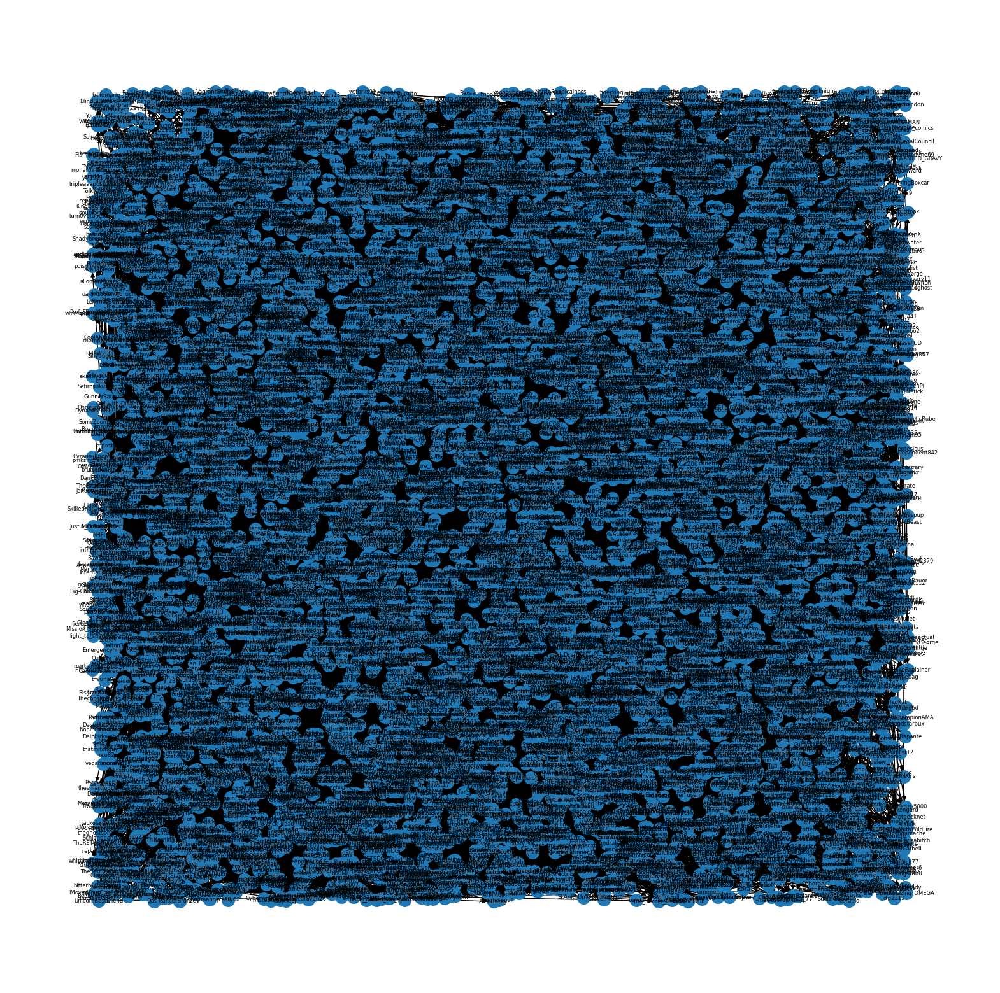

In [12]:
import networkx as nx
import matplotlib.pyplot as plt

G_tv = nx.DiGraph()
G_tv.add_nodes_from(tv_unique_author_names)
G_tv.add_edges_from(tv_result_tuple_list)
nx.write_graphml(G_tv, "/content/drive/Shareddrives/BigDataSubReddit/tv_network.graphml")

fig, ax = plt.subplots(figsize=(20, 20))
pos = nx.random_layout(G_tv)
nx.draw(G_tv, pos, with_labels=True, font_size=6, node_size=200)
plt.show()


**The tv network from gaphi:**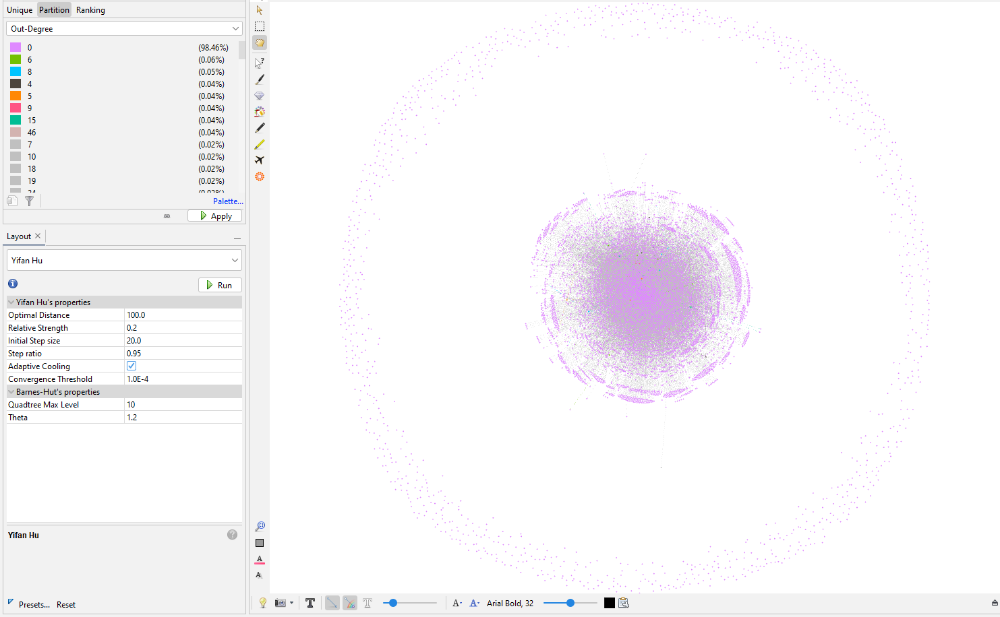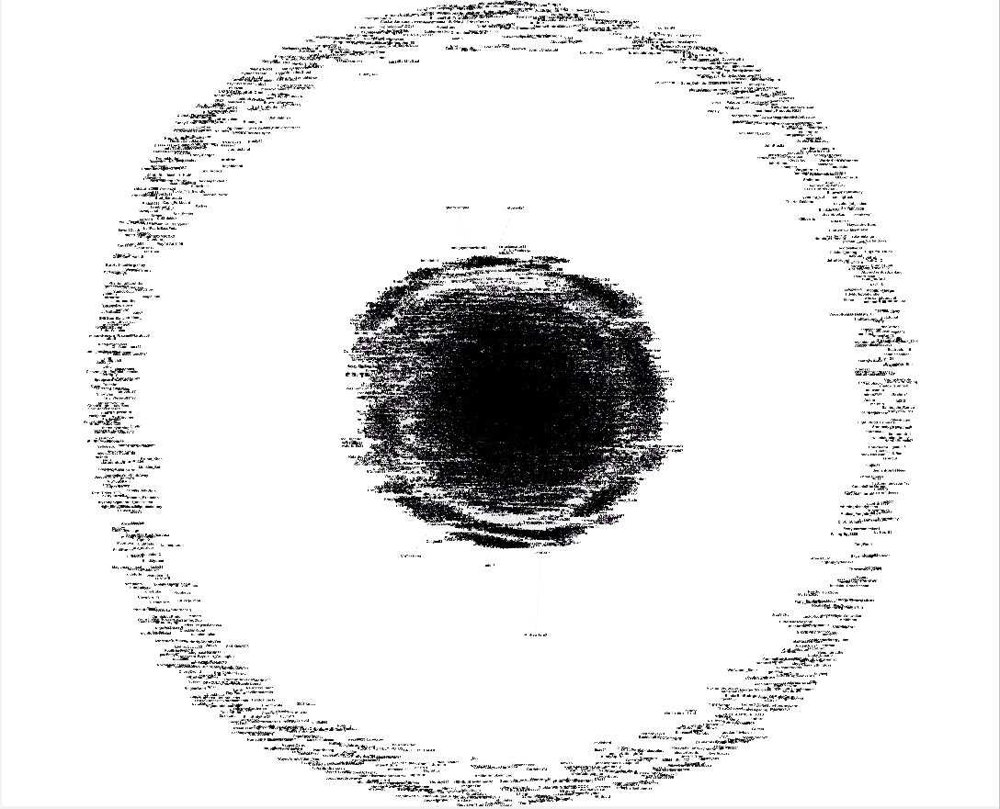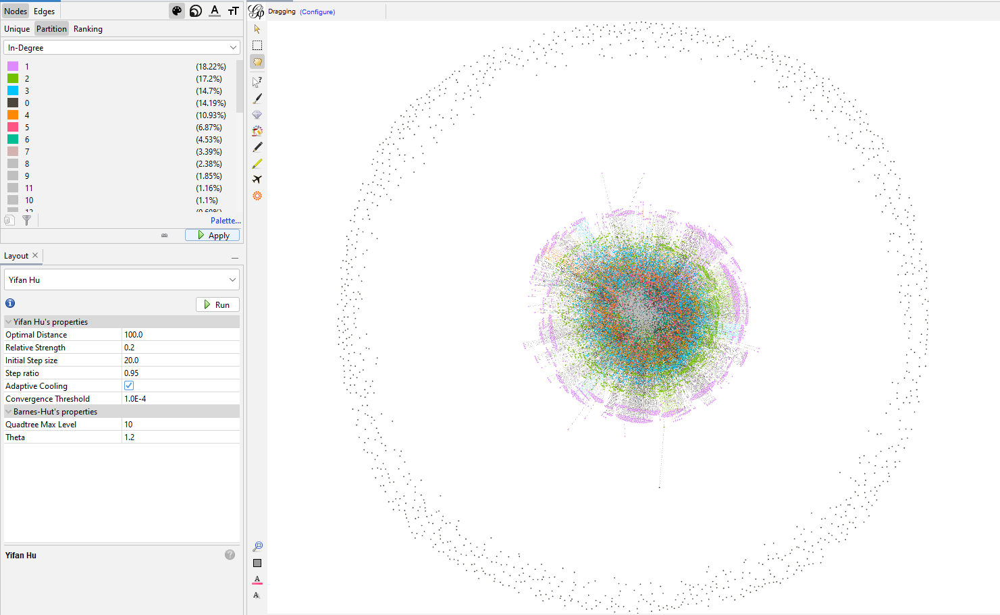

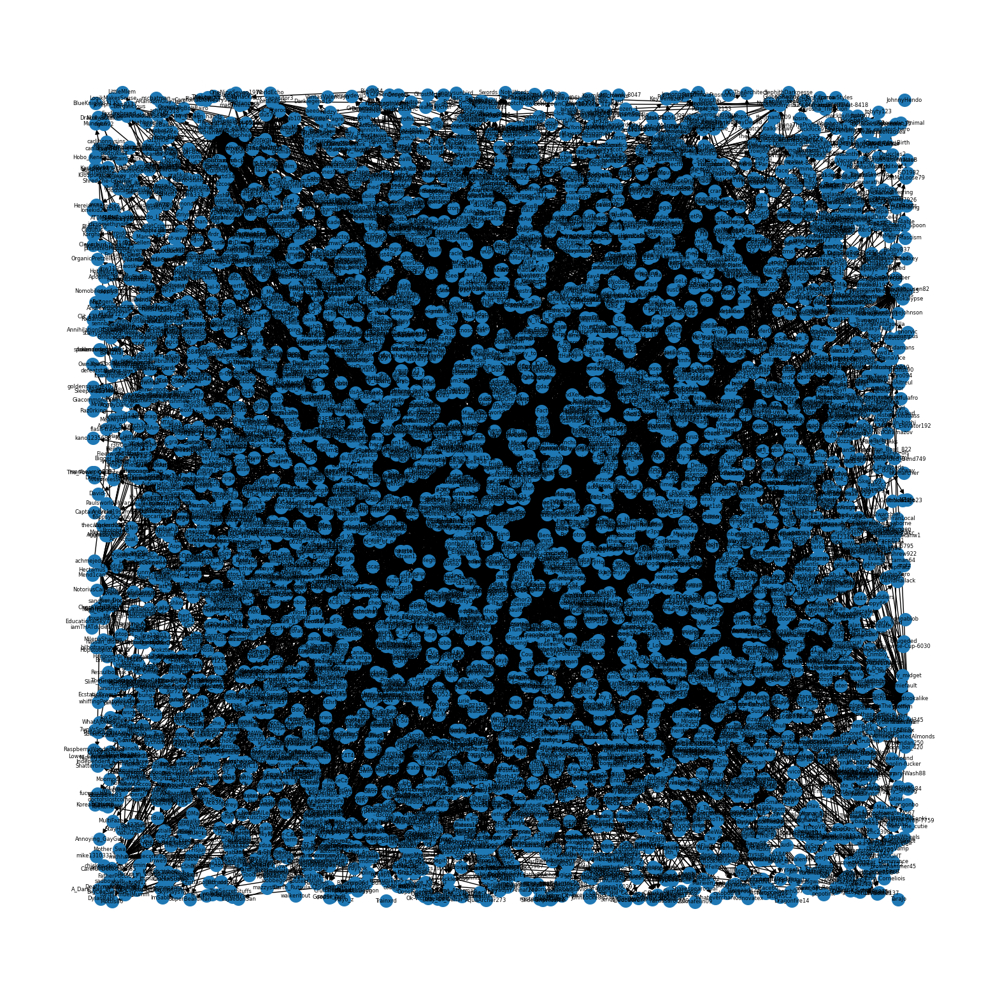

In [13]:
G_gaming = nx.DiGraph()
G_gaming.add_nodes_from(gaming_unique_author_names)
G_gaming.add_edges_from(gaming_result_tuple_list)
nx.write_graphml(G_gaming, "/content/drive/Shareddrives/BigDataSubReddit/gaming_network.graphml")

fig, ax = plt.subplots(figsize=(20, 20))
pos = nx.random_layout(G_gaming)  # Choose a layout (e.g., spring_layout)
nx.draw(G_gaming, pos, with_labels=True, font_size=6, node_size=200)
plt.show()

**The gaming network from gaphi:**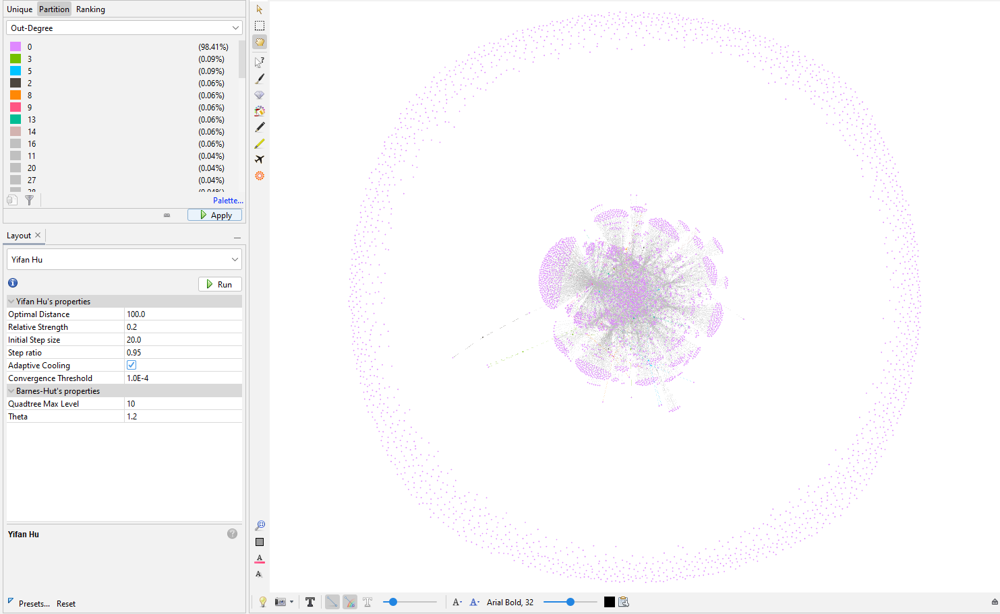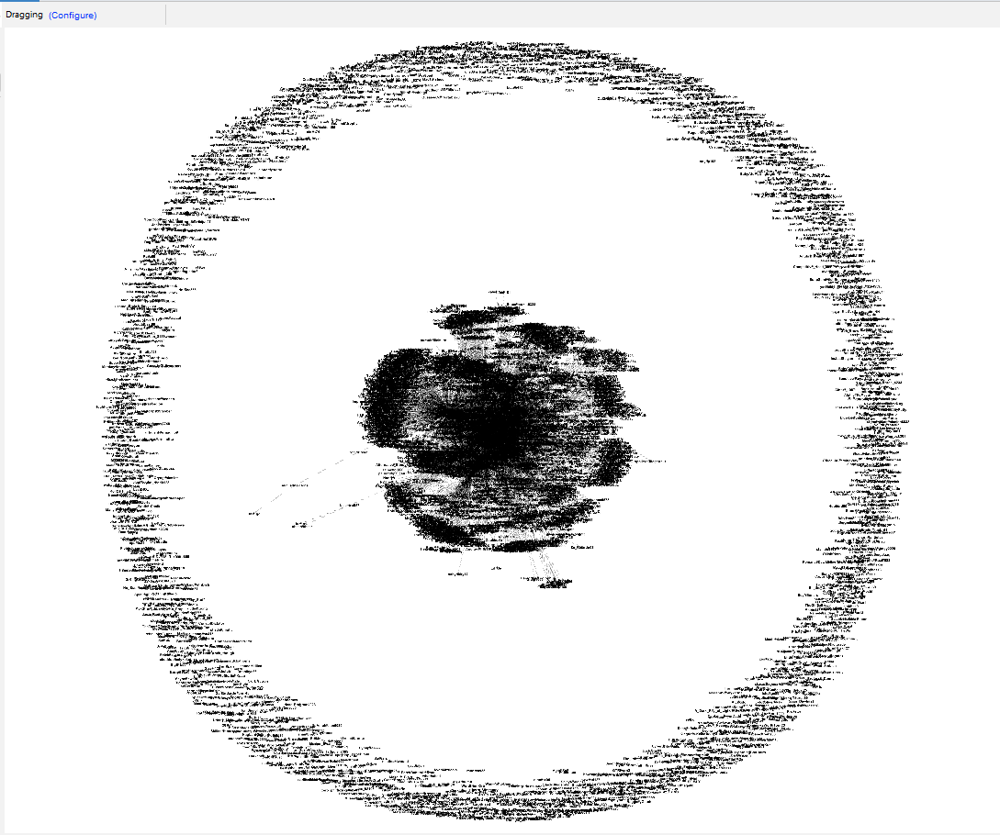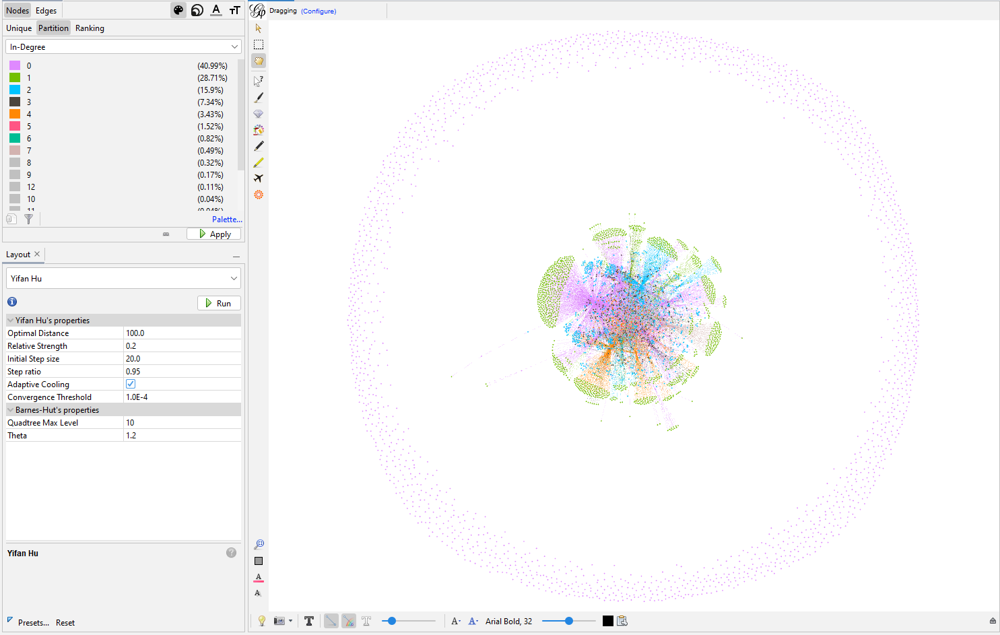